# Investigating TLS in CRC samples

## Import libraries

In [1]:
import spatialdata as sd
import squidpy as sq

/software/cellgen/team361/ms83/envs/mintflow-revision/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/software/cellgen/team361/ms83/envs/mintflow-revision/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/software/cellgen/team361/ms83/envs/mintflow-revision/lib/python3.11/site-packages/squidpy/gr/_utils.py:23: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('annd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd

## Patient P2

In [3]:
path_adata = '/nfs/team361/ms83/data/CRC/visiumHD_mintflow/raw_data/adata_sc_P2_rawformintflow_7K_svg.h5ad'

In [4]:
adata = sc.read_h5ad(path_adata)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


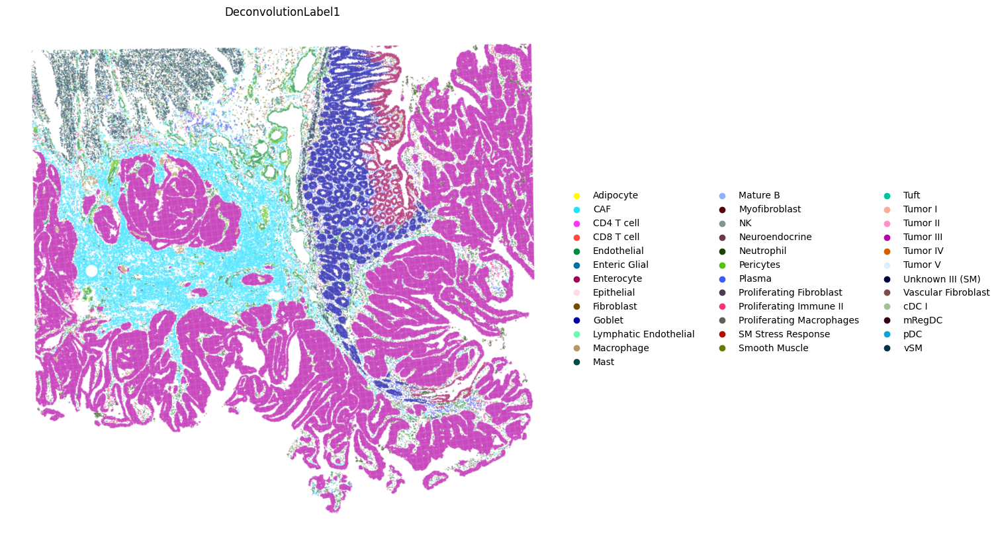

In [48]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",    
    ],
    wspace=0.4,
    size=0.02,
    figsize=(15, 15),
    frameon=False
)

In [50]:
tls_signature_crc = [
    'ITGAM',  # CD11
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CR2',   # CD21 
    'FCER2',    # CD23
    'CXCR5',    # Follicular helper T cells
    'NTAN1', # PNAD, High endothelial venules (HEVs)
    'CCL21', # chemokine
    'CXCL13', # Chemokine
    'LYVE1' # lymphaic endothelium
]

sc.tl.score_genes(adata, tls_signature_crc, score_name='TLS_crc')

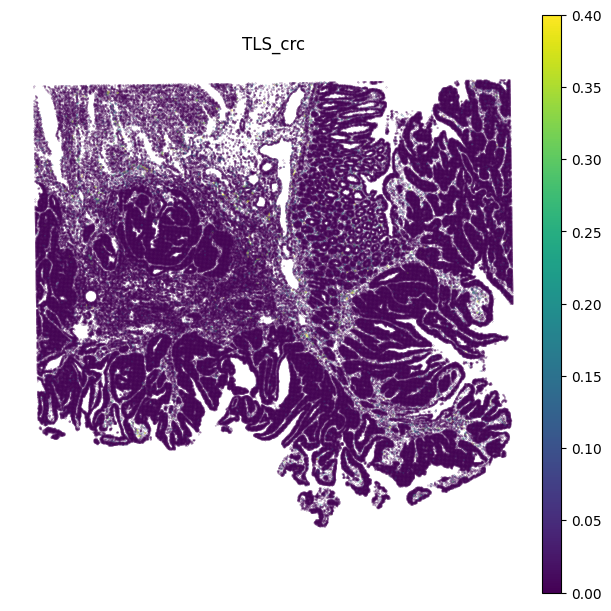

In [51]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["TLS_crc"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.4,
    frameon=False
)

In [52]:
tls_signature_minimal = [
    'CXCL13',  # Most specific TLS marker
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CCL21',   # TLS chemokine
    'BCL6',    # Germinal centers
    'CXCR5'    # Follicular helper T cells
]

sc.tl.score_genes(adata, tls_signature_minimal, score_name='TLS_general')

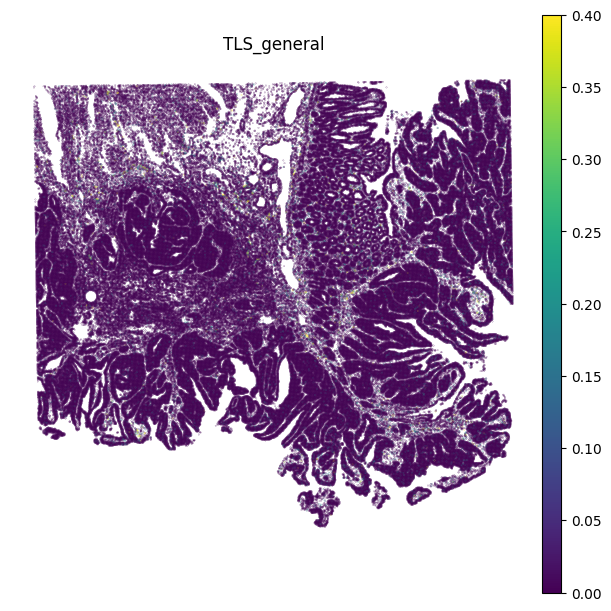

In [53]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["TLS_general"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.4,
    frameon=False
)

## Patient P1

In [9]:
path_adata1 = '/nfs/team361/ms83/data/CRC/visiumHD_mintflow/raw_data/adata_sc_P1_rawformintflow_7K_svg.h5ad'

In [10]:
adata = sc.read_h5ad(path_adata1)

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


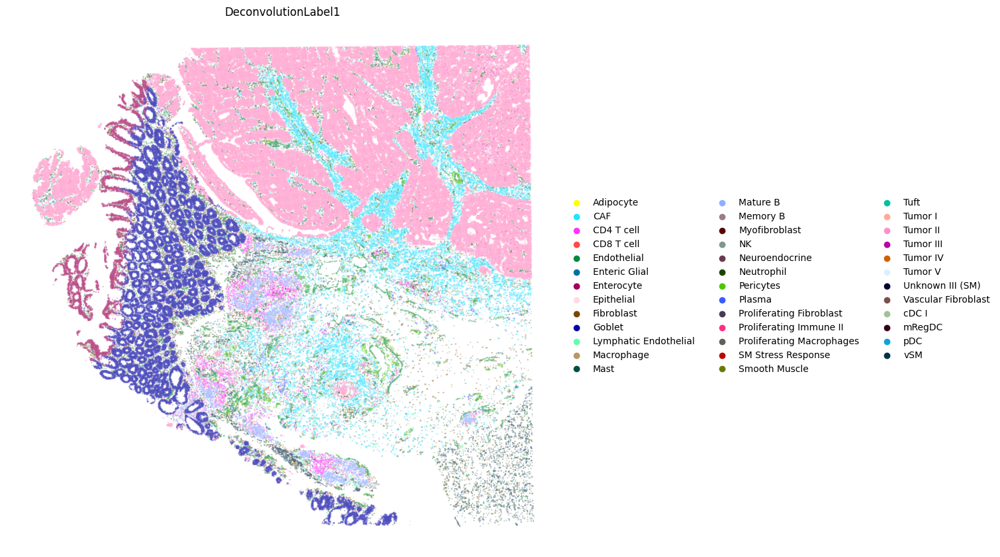

In [59]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",    
    ],
    wspace=0.4,
    size=0.02,
    figsize=(15, 15),
    frameon=False
)

In [60]:
adata

AnnData object with n_obs × n_vars = 235530 × 7000
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id', 'inflow_CT', 'inflow_BatchID', 'MintFlow_microenv_score'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'DeconvolutionLabel1_colors', 'DeconvolutionLabel2_centrality_scores', 'DeconvolutionLabel2_colors', 'DeconvolutionLabel2_nhood_enrichment', 'log1p', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap', 'inflow_CT_colors', 'X_PCA_barint', 'neighbors_barint', 'X_UMAP_barint', 'X_PCA_barmic', 'neighbors_barmic', 'X_UMAP_barmic', 'X_PCA_int', 'neighbors_int', 'X_UMAP_int', 'X_PCA_mic', 'neighbors_mic', 'X_UMAP_mic'
    obsm: 'X_pca', 'X_umap', 'spatial', 'MintFlow_Xint', 'MintFlow_Xmic', 'MintFlow_Xbar_int', 'MintFlow_Xbar_mic', 'MintFlow_S_in', 'MintFlow_S_out', 'MintFlow_Z', 'MintFlow_Xint (before_sc_pp_normali

In [61]:
tls_signature_crc = [
    'ITGAM',  # CD11
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CR2',   # CD21 
    'FCER2',    # CD23
    'CXCR5',    # Follicular helper T cells
    'NTAN1', # PNAD, High endothelial venules (HEVs)
    'CCL21', # chemokine
    'CXCL13', # Chemokine
    'LYVE1' # lymphaic endothelium
]

sc.tl.score_genes(adata, tls_signature_crc, score_name='TLS_crc')

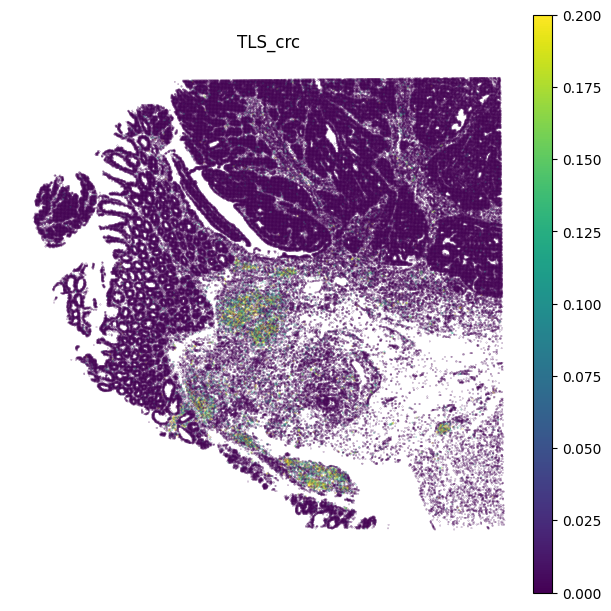

In [70]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["TLS_crc"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.2,
    frameon=False
)

In [64]:
tls_signature_minimal = [
    'CXCL13',  # Most specific TLS marker
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CCL21',   # TLS chemokine
    'BCL6',    # Germinal centers
    'CXCR5'    # Follicular helper T cells
]

sc.tl.score_genes(adata, tls_signature_minimal, score_name='TLS_general')

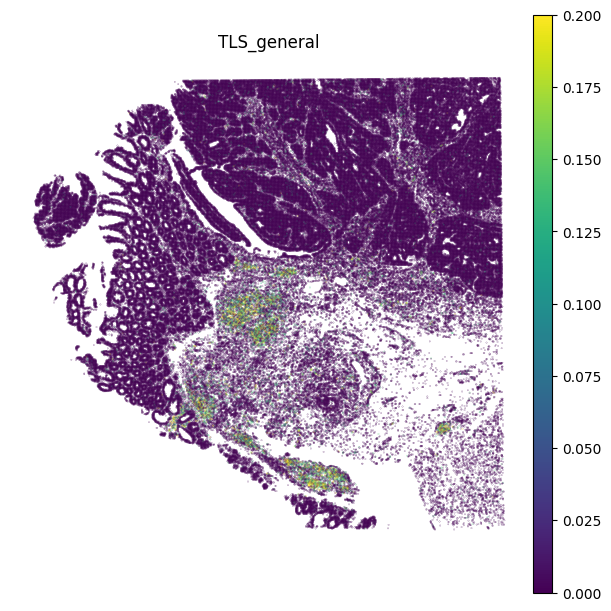

In [69]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["TLS_general"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.2,
    frameon=False
)

## Patient P5

In [3]:
path_adata2 = '/nfs/team361/ms83/data/CRC/visiumHD_mintflow/Outputs_nb1_P5_annealing/adata_P5_mic_score.h5ad'

In [4]:
adata2 = sc.read_h5ad(path_adata2)

/software/cellgen/team361/ms83/envs/mintflow-revision/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


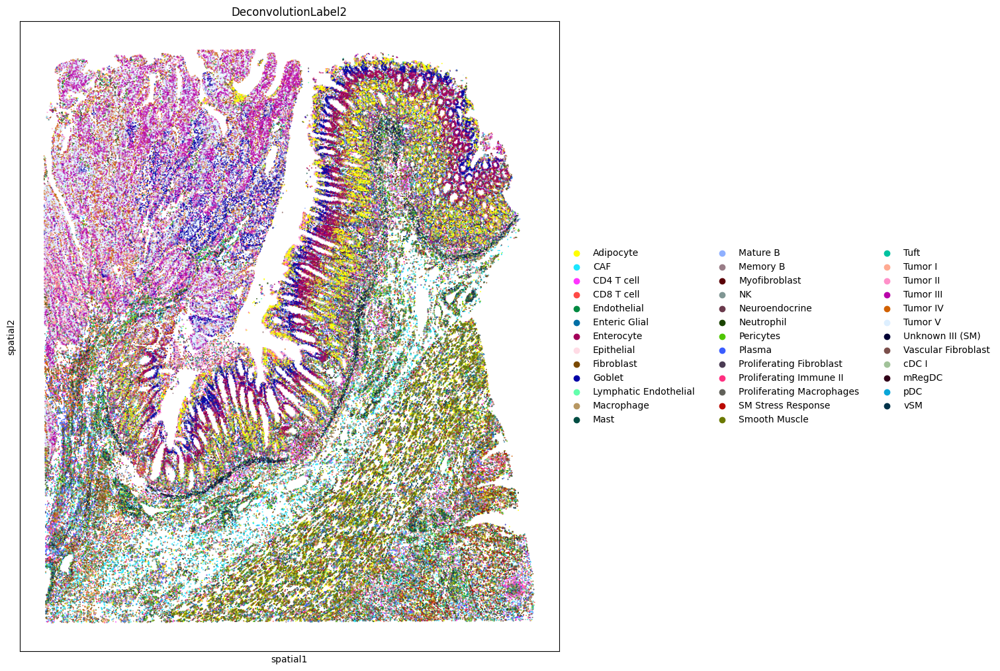

In [5]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",    
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

/software/cellgen/team361/ms83/envs/mintflow-revision/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


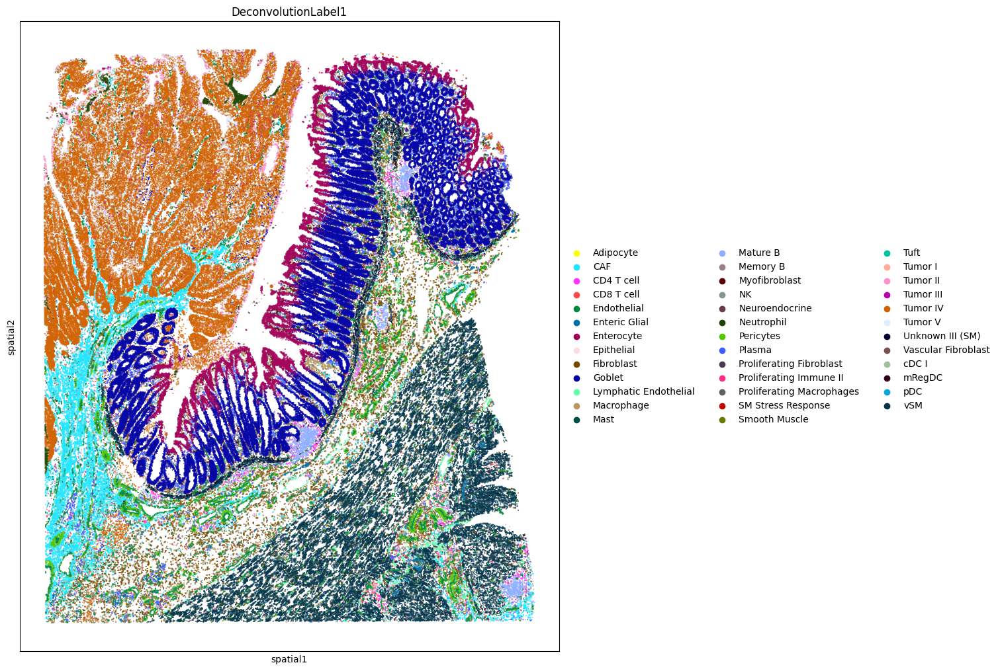

In [6]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel1",    
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

In [9]:
tls_signature_minimal = [
    'CXCL13',  # Most specific TLS marker
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CCL21',   # TLS chemokine
    'BCL6',    # Germinal centers
    'CXCR5'    # Follicular helper T cells
]

sc.tl.score_genes(adata2, tls_signature_minimal, score_name='TLS_general')

In [12]:
tls_signature_crc = [
    'ITGAM',  # CD11
    'MS4A1',   # CD20, B cells
    'CD3D',    # T cells
    'CD79A',   # B cells
    'CR2',   # CD21 
    'FCER2',    # CD23
    'CXCR5',    # Follicular helper T cells
    'NTAN1', # PNAD, High endothelial venules (HEVs)
    'CCL21', # chemokine
    'CXCL13', # Chemokine
    'LYVE1' # lymphaic endothelium
]

sc.tl.score_genes(adata2, tls_signature_crc, score_name='TLS_crc')

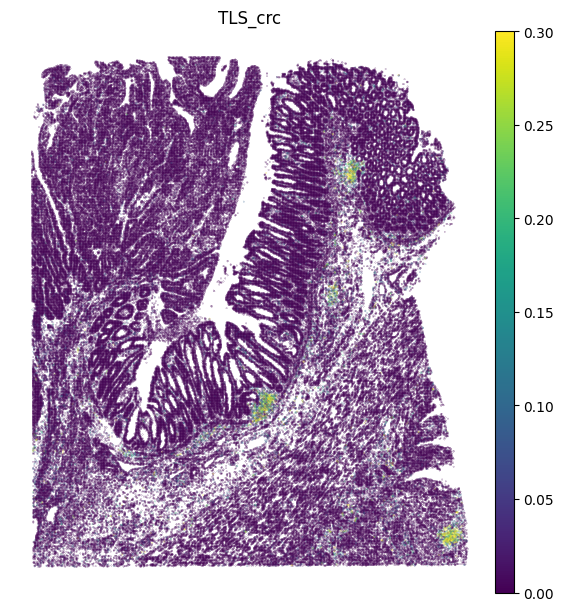

In [17]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=["TLS_crc"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.3,
    frameon=False
)

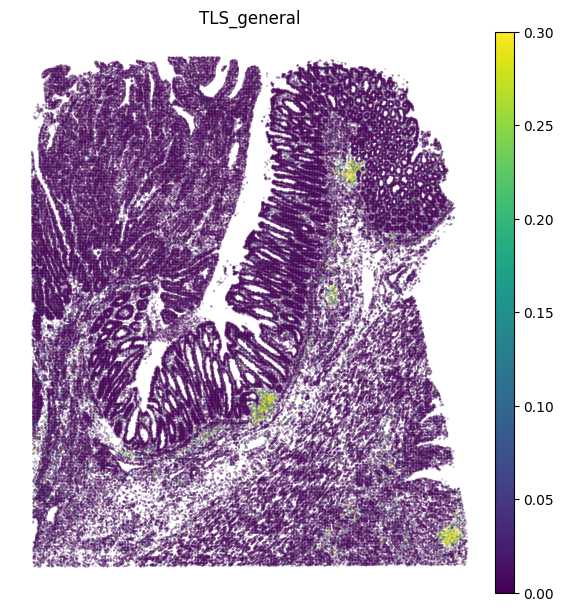

In [18]:
sq.pl.spatial_scatter(
    adata2,
    library_id="spatial",
    shape=None,
    color=["TLS_general"],
    #groups=["CD8 T cell"],   # cell type(s) of interest
    wspace=0.4,
    size=0.02,
    figsize=(6, 6),
    #cmap='coolwarm',
    vmin=0,
    vmax=0.3,
    frameon=False
)